# Demo Run

In [1]:
# %load_ext autoreload
# %autoreload 2
# # this may cause DisentenglementTargetManager to reimported, losing all the data e.g. configurations.

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

In [3]:
import os
import sys
import gc
import warnings
import anndata as ad
import scanpy as sc
import torch
from pathlib import Path

sys.path.append(str(Path(os.getcwd()).resolve().parents[0]))

import tardis

local_run = False
if local_run:
    tardis.config = tardis.config_local
else:
    tardis.config = tardis.config_server
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [4]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_subset_sex_2.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.shape

(15850, 2048)

In [5]:
sc.pp.filter_cells(adata, min_genes=10, inplace=True)
adata.shape

(13834, 2048)

In [16]:
disentenglement_targets_configurations=[
    dict(
        obs_key = "sex",
        n_reserved_latent = 1,
        counteractive_minibatch_settings = dict(
            method = "random",
            method_kwargs = dict(
                within_labels = False,
                within_batch = False,
                within_categorical_covs = None,
                within_other_groups = True,
                seed = "forward",
            )
        ),
        auxillary_losses = dict(
            reserved_subset = dict(
                apply = True, 
                method = "mse_z", 
                weight = 500, 
                transformation = "inverse", 
                progress_bar = True,
                method_kwargs = {}
            ),
            unreserved_subset = dict(
                apply = False, 
                method = "mse_z", 
                weight = 1, 
                transformation = "none",
                progress_bar = False,
                method_kwargs = {}
            ),
            complete_latent = dict(
                apply = False, 
                method = "mse_z", 
                weight = 0.010, 
                transformation = "negative",
                progress_bar = False, 
                method_kwargs = {}
            ),
        ),
    )
]

model_params = dict(
    n_hidden=256,
    n_layers=3, 
    n_latent=20, 
    gene_likelihood="nb",
    dropout_rate = 0.1,
    include_auxillary_loss = True
)
train_params = dict(
    max_epochs=400,
    train_size=0.9,
    batch_size=512,
    check_val_every_n_epoch=10,
    plan_kwargs = dict(
        n_epochs_kl_warmup=400,
        # weight_decay=1e-3,
        # optimizer="AdamW"
    )
)
dataset_params = dict(
    layer=None, 
    labels_key="cell_type",
    batch_key="concatenated_integration_covariates",
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)

# tardis.MyModel.setup_wandb(
#     wandb_configurations=tardis.config.wandb,
#     hyperparams=dict(
#         model_params=model_params,
#         train_params=train_params,
#         dataset_params=dataset_params,
#     )
# )

vae = tardis.MyModel(adata, **model_params)
vae.train(**train_params)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1/400:   0%|                                                                                                                                     | 0/400 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:60: UserWarning: Possible group definition indices are calculating for `sex` for `training` set.
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:60: UserWarning: Number of elements in each group for `sex` in `training` set: 6657,5794
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 11/400:   2%|▊                               | 10/400 [00:05<03:07,  2.08it/s, v_num=1, total_loss_train=133, kl_local_train=54.4, tardis|sex|reserved_subset_train=78.1]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:60: UserWarning: Possible group definition indices are calculating for `sex` for `validation` set.
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:60: UserWarning: Number of elements in each group for `sex` in `validation` set: 766,617
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 400/400: 100%|██████████████████████████████| 400/400 [03:00<00:00,  2.29it/s, v_num=1, total_loss_train=146, kl_local_train=28.6, tardis|sex|reserved_subset_train=16.8]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████████████████████████| 400/400 [03:00<00:00,  2.22it/s, v_num=1, total_loss_train=146, kl_local_train=28.6, tardis|sex|reserved_subset_train=16.8]


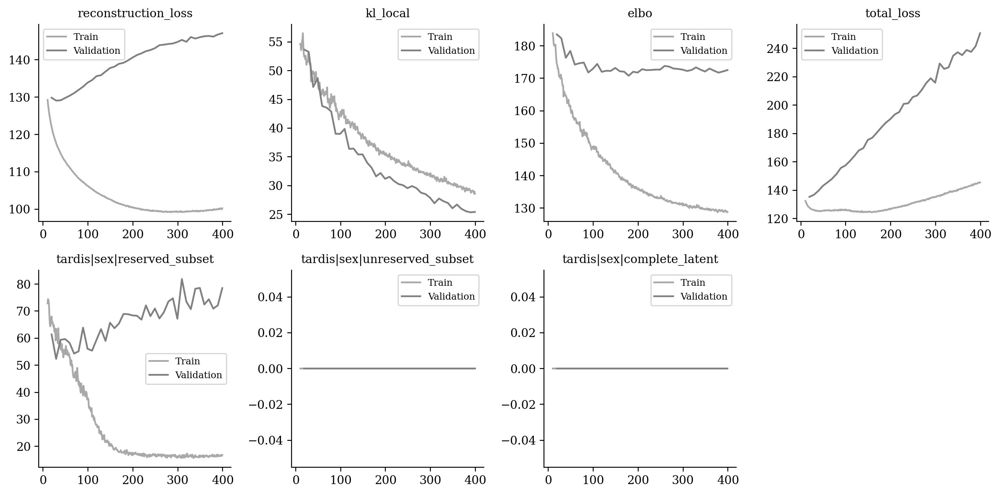

In [17]:
vae.plot_training_history(
    ignore_first=10, 
    n_col=4,
    metrics_name=[
        "reconstruction_loss", "kl_local", "elbo", "total_loss",
        "tardis|sex|reserved_subset", 
        "tardis|sex|unreserved_subset", 
        "tardis|sex|complete_latent"
    ]
)

In [18]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
DisentenglementTargetManager.configurations.get_by_obs_key("sex").reserved_latent_indices

[0]

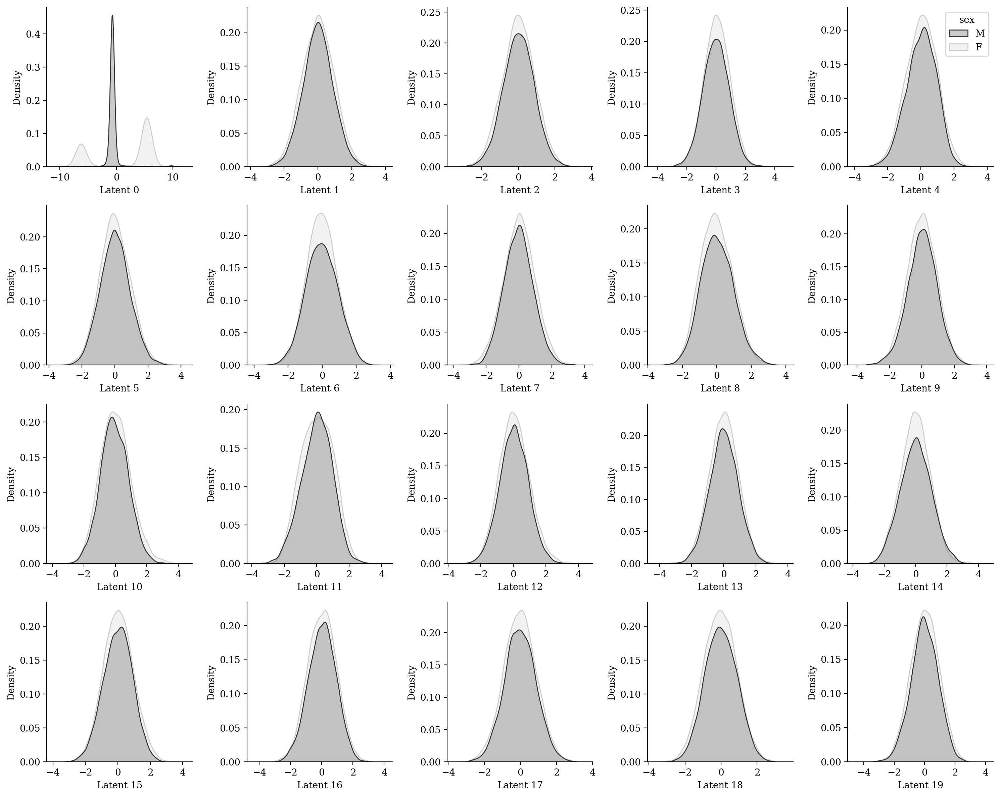

In [19]:
vae.plot_latent_kde(
    adata_obs=adata.obs,  # .iloc[vae.train_indices,:],
    target_obs_key="sex",
    latent_representation=vae.get_latent_representation(),  # [vae.train_indices,:],
    latent_dim_of_interest=None
)

# Playground

# Visualization

(13834, 20)

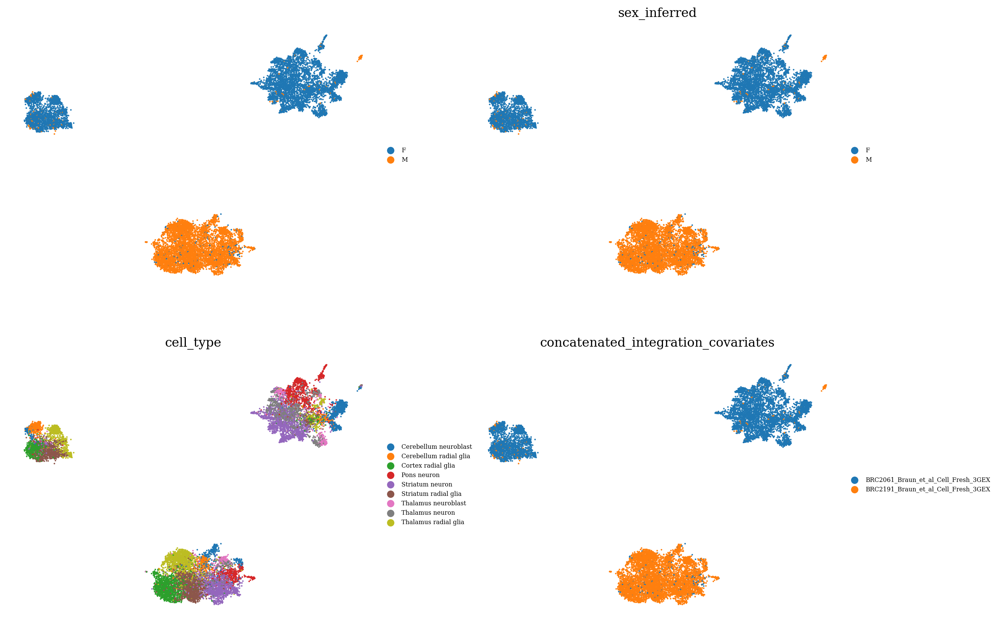

In [20]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent, min_dist=0.2)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["sex", "sex_inferred", "cell_type", "concatenated_integration_covariates"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )
    
del latent
gc.collect();

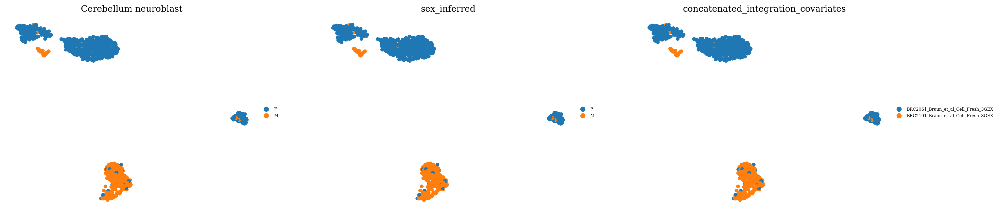

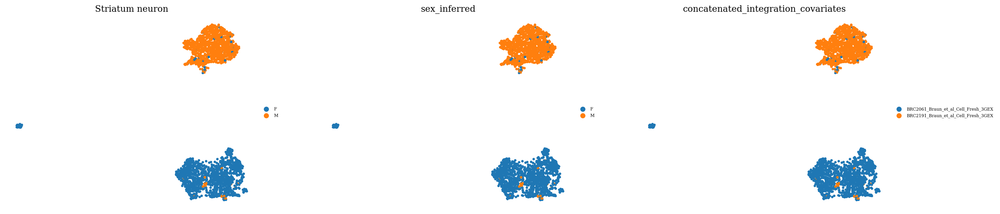

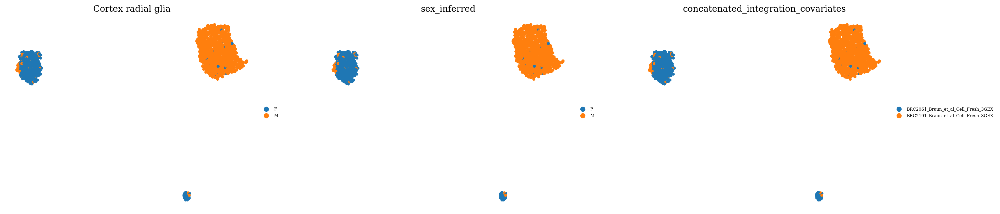

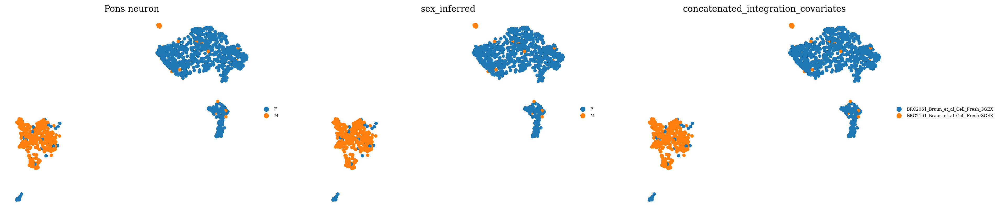

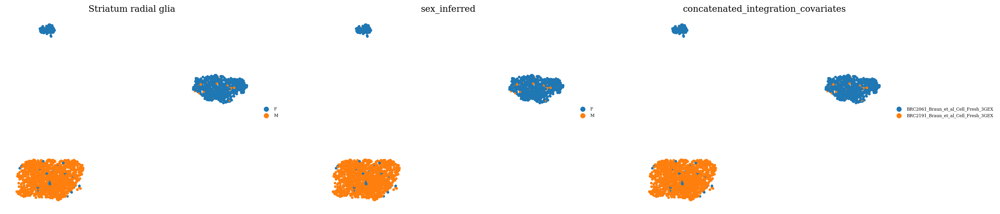

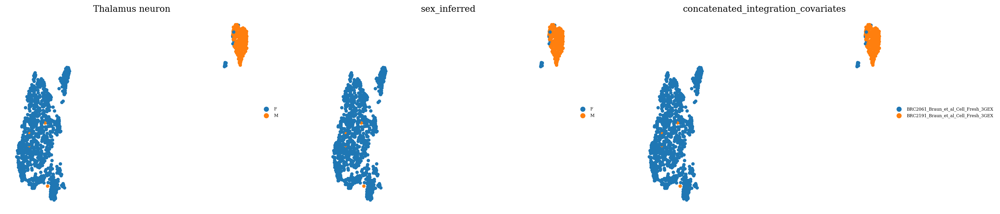

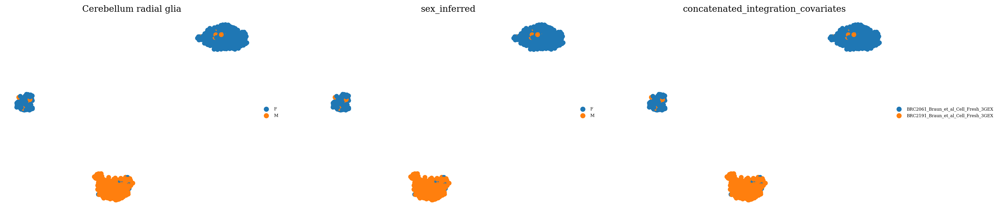

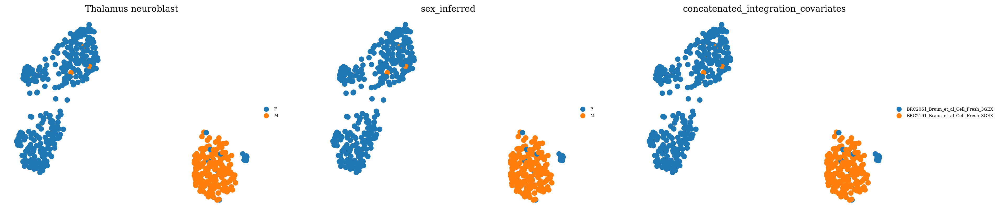

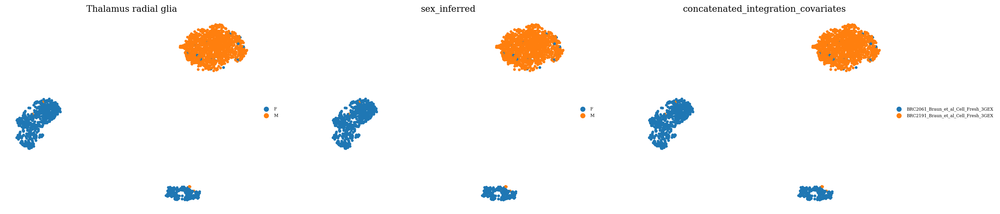

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
for cell_type in latent.obs["cell_type"].unique():
    _latent = latent[latent.obs["cell_type"] == cell_type].copy()
    sc.pp.neighbors(_latent, n_neighbors = 30)
    sc.tl.umap(_latent, min_dist=0.2)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        sc.pl.umap(
            _latent, 
            color=["sex", "sex_inferred", "concatenated_integration_covariates"], 
            ncols=3,
            frameon=False,
            title=cell_type,
            legend_fontsize="xx-small"
        )
    del _latent
    gc.collect();

del latent
gc.collect();

(13834, 19)

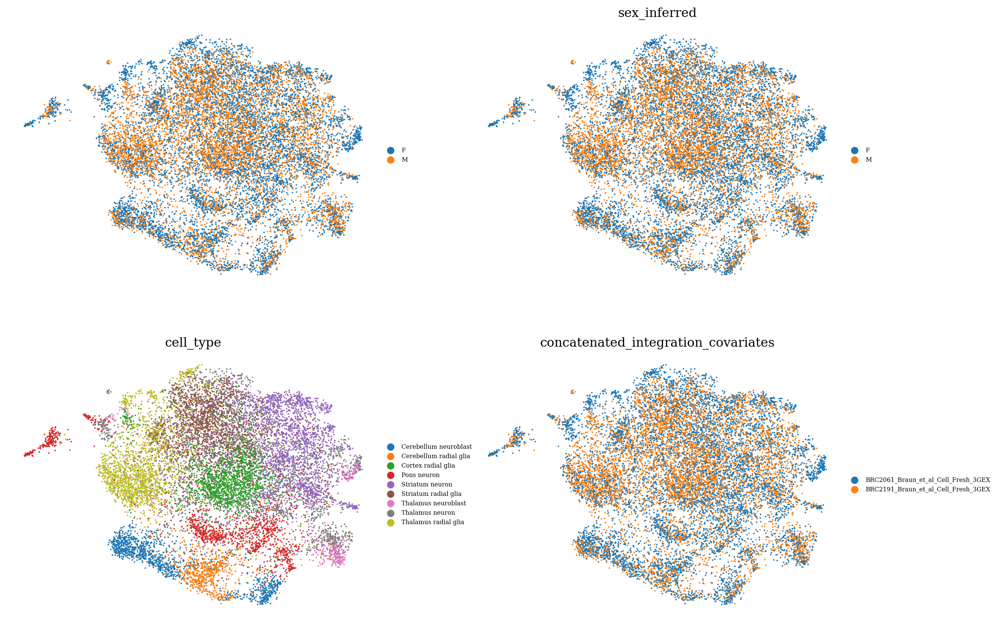

In [22]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("sex").unreserved_latent_indices], obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent, min_dist=0.2)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["sex", "sex_inferred", "cell_type", "concatenated_integration_covariates"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

(13834, 1)

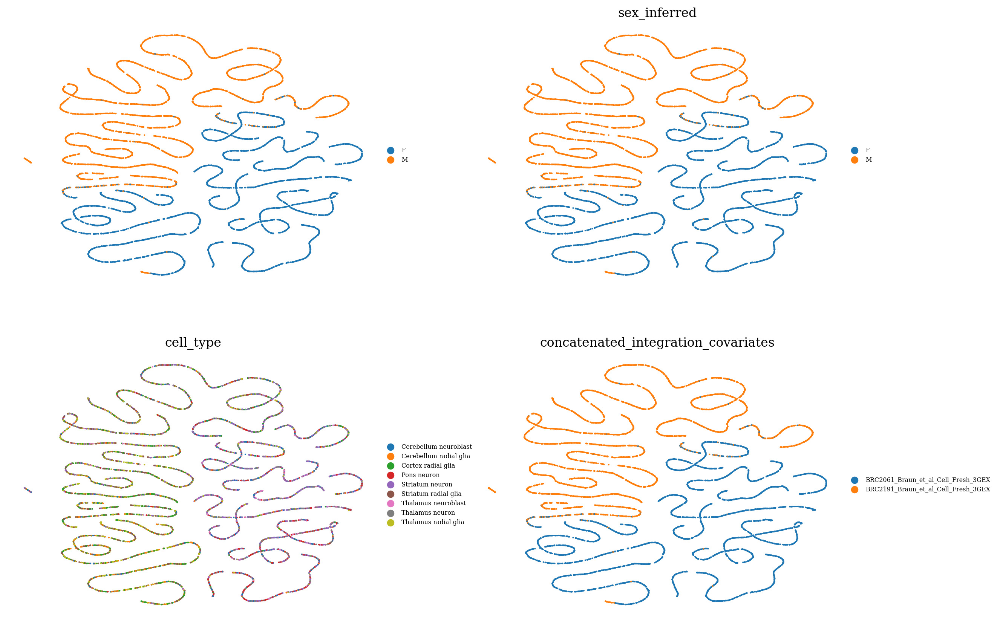

In [23]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("sex").reserved_latent_indices], obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent, min_dist=0.2)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["sex", "sex_inferred", "cell_type", "concatenated_integration_covariates"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

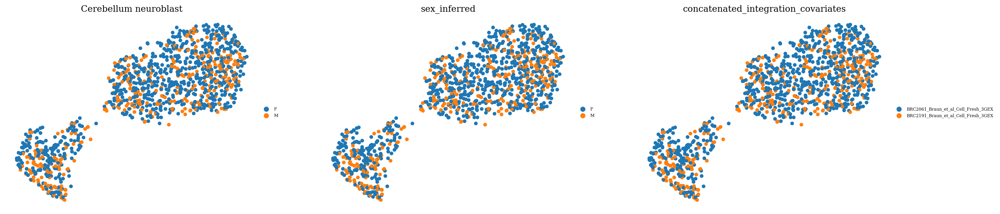

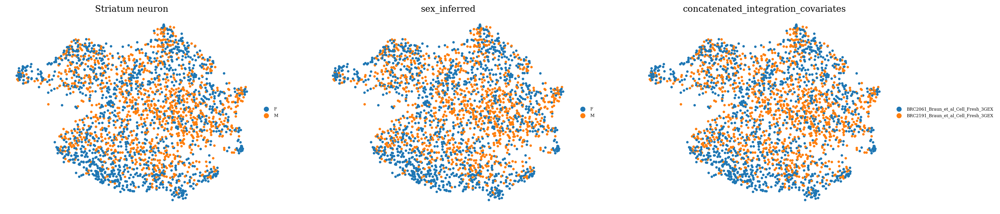

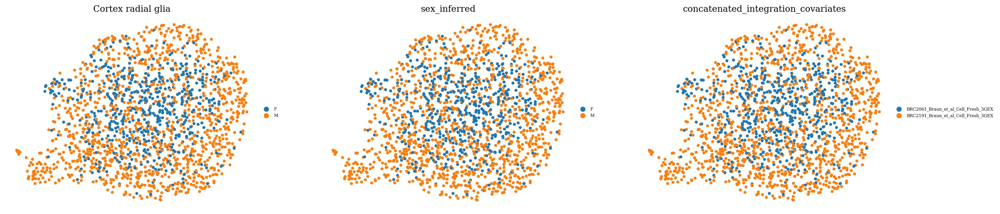

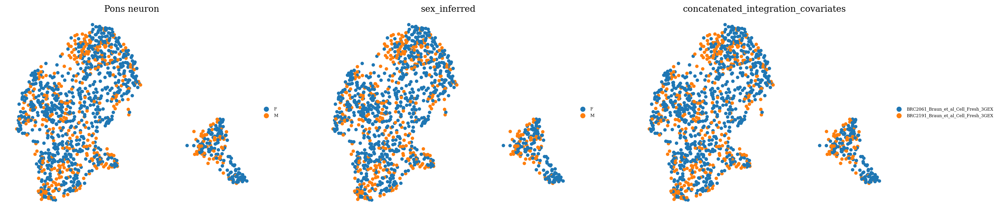

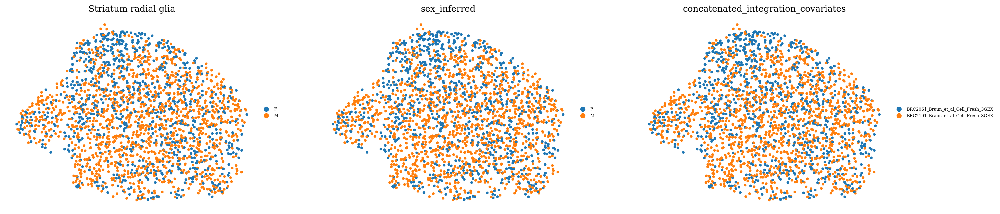

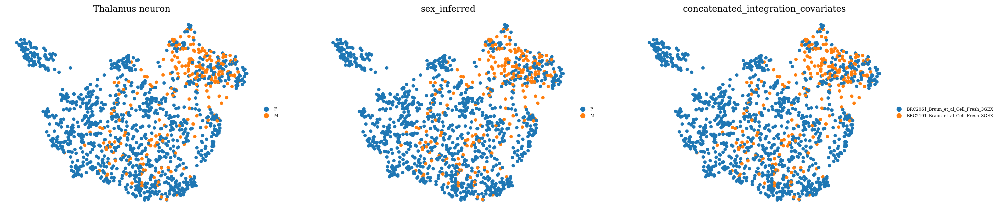

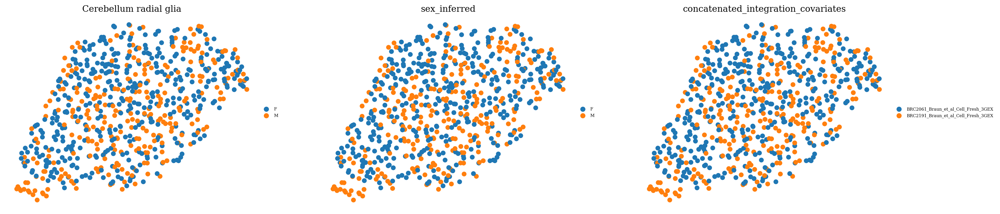

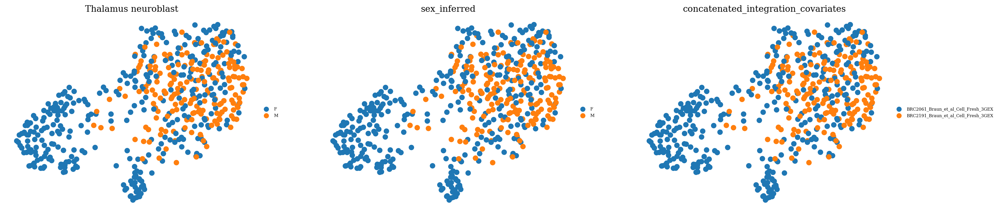

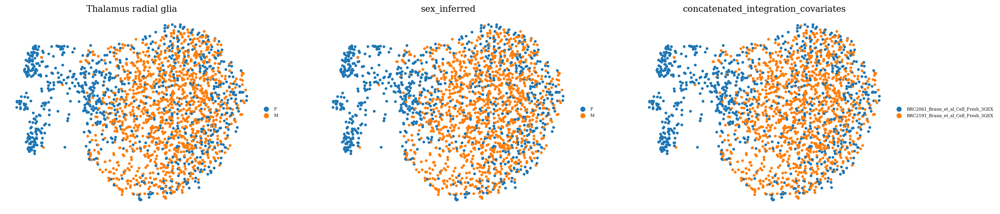

In [24]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("sex").unreserved_latent_indices], obs=adata.obs.copy())
for cell_type in latent.obs["cell_type"].unique():
    _latent = latent[latent.obs["cell_type"] == cell_type].copy()
    sc.pp.neighbors(_latent, n_neighbors = 30)
    sc.tl.umap(_latent, min_dist=0.2)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        sc.pl.umap(
            _latent, 
            color=["sex", "sex_inferred", "concatenated_integration_covariates"], 
            ncols=3,
            frameon=False,
            title=cell_type,
            legend_fontsize="xx-small"
        )
    del _latent
    gc.collect();
    
del latent
gc.collect();